# <center>Computer Vision </center>
# <center>Assignment No - 2 : The Secrets of Optical Flow</center>

# 1. Basic of Optical Flow

## 1.1 Thought Experiments 

#### 1. The number-one use of optical flow in visual effects is for retiming a sequence — speeding it up or slowing it down. Describe how optical flow could be used to create slow motion video. You can find the answer in Amazing Slow-Motion Videos with Optical Flow video on YouTube. 

<b>Answer</b> - Interpolation is a method by which we can estimate new frames between 2 consecutive frames. Optical Flow uses the concept to interpolation for estimating the most probable frame which can be fitted between the two frames. For example, let say we have 2 frames, and we need to add one more frame in between two frames, we can simply find the mean of both frames and fit the resultant frames between two frames. This additional frame will convert our videos in slow motion. 

#### 2. In The Matrix, one of the most remembered, iconic use of the tactic comes during the rooftop scene where Neo effortlessly dodges one bullet after another. (Re-)watch “Bullet Time” here and explain briefly how optical flow is used. You may also find this amazing video on bullet-time interesting. 

<b>Answer</b> –  Slow motion videos can be created using either recording the video at very high fps rate or by adding frames between existing frames using interpolation. We can deploy multiple number of cameras to catch a greater number of frames per shot and we can combine the frames taken by multiple cameras. Also, we will have camera at different such that we will be able cover 360 degrees spectrum of the shot. Also, we can use the concept of interpolation to find the intermediate frames and add those frames to make video smoother and slower. In the case, they have combined the concept amazingly well to create the illumination. Bullet time is created in The Matrix on a green screen set with a succession of stationary cameras encircling the subject. The cameras are turned on in quick succession, and the generated frames are presented with additional CGI interpolated frames, giving the impression that the camera is moving quicker than the subject. 


#### 3. So breathtaking, heartbreaking and brimming with emotion, WDMC is a journey into the afterlife and deals with a dead man’s attempt to reunite with his wife. Catch a glimpse of the” Painted World” here! You will now describe briefly on how optical flow is used to create this “painterly effect”. 

<b>Answer</b> – To get the painterly effect, we will first determine the change vector for each pixel. We must find the optical flow between two frames and then plot this optical flow on the frame. Optical flow works by generating a motion vector map for every pixel in a frame. For each frame, a sub-pixel positional value of x and y is created, which can then be compared to the next. This effectively tracks the movement of each and every piece within a composition. 

#### 4. Consider a Lambertian ball that is: (i) rotating about its axis in 3D under constant illumination and (ii) stationary and a moving light source. What does the 2D motion field and optical flow look like in both cases. 

<b>Answer</b> - In 1st  case when the Lambertian ball is rotating about its axis and the light source is fixed, we will not be able to find any optical flow even though the ball is continuously moving. This happens because the surface of the ball is even throughout and there is no change in intensity at time t and t+dt. 

In 2nd case when the Lambertian ball is fixed and the light source is moving, we will get the optical flow even though the ball is not moving. This is because the light source is moving so the shadow and the pixels which are the facing the light will change constantly. So, there will be some difference in intensities of pixel at time t and time t+ dt which will give us the optical flow. 

In both cases, the optical flow is not equal to the motion field. 

## 1.2 Concept Review  

#### 1. List down the important assumptions made in optical flow estimation. Describe each one of them in one-two lines. 

<b>Answer</b> - The two important assumptions made in optical flow estimation are as follows: 
1. The observed brightness of any object point is constant over time: The assumption is based on the consideration that pixels in a small window usually follow the similar displacement and hence the movement of the pixels under considerations in consecutive frames over a window will give the similar optical flow. 
2. I Nearby points in the image plane move in a similar manner (velocity smoothness constraint): The assumption is based on the consideration that pixels in a small window have a similar flow and tend to follow it. Hence, we get similar intensity values over the small window of pixels. 

#### 2. Formalize the objective function of the classical optical flow problem. Clearly mark the data term and the spatial term. What does the objective function imply about the noise distribution? 

<b>Answer</b> - In Optical Flow problem, we make basic assumptions that the intensity of pixel at time t is equal to intensity at time t+dt. 

I(x,y,t) =  I(x+u,y+v,t+dt)
 
I(x,y,t) =  I(x,y,t+dt)+Ix⋅u+Iy⋅v
 
Ix⋅u + Iy⋅v + It = 0  
 
Here,   Ix= dI/dx(Partial differential of I w.r.t to x)           
        Iy=dI/dy (Partial differential of I w.r.t to y)      		
        It=dI/dt (Partial differential of I w.r.t to t) 


The <b>Ix and Iy </b>terms in the equation are called data terms and <b>It </b>is the spatial term. 

Before finding the optical flow, we must apply Gaussian blur to the image to decrease the noise distribution because the objective function does not include a noise distribution term, we must first pre-process the image before applying it. 

#### 3. In optimization, why is the first-order Taylor series approximation done? 

<b>Answer</b> - The brightness constancy assumption in optical flow is that the intensity of pixels in a narrow window remains constant over time. So, 

I(x,y,t)=I(x+dx,y+dy,t+dt)
 
Because the difference is very little, we can use the Taylor series approximation on the given equation. The Taylor series approximation's higher-order terms become very close to 0 and are hence discarded. As a result, we're left with only the first-order Taylor series approximation terms. We just consider the change in intensity rather than the intensity values in each subsequent frame with the help of this optimization. 

#### 4. Geometrically show how the optical flow constraint equation is ill-posed. Also, draw the normal flow clearly. 

<b>Answer</b> - When we try to get an optical flow for the edges of some patterns then it miscalculates the optical flow. For example, as we can see in the image that with the data in the small circle we cannot tell which direction it is moving. Due to small size of the aperature the remaining portion of the rectangle given is not visible to aperature. So when we calculate optical flow in such cases their are very high chances that we will calculate it incorrectly.
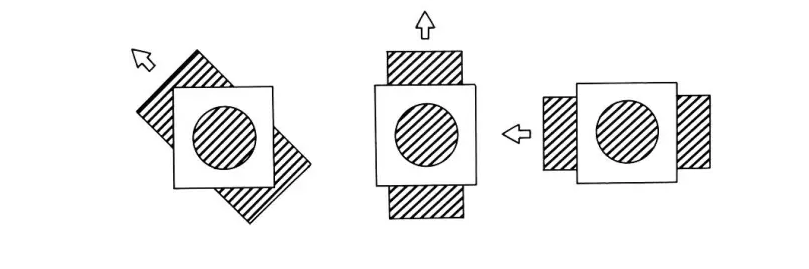

# 2. Single-Scale Lucas-Kanade Optical Flow

## 2.1 Keypoint Selection: Selecting Pixels to Track

In [1]:
import cv2
from scipy import signal as sig
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image as im
import os

In [2]:
def read_flow(filename):
    """
    read optical flow from Middlebury .flo file
    :param filename: name of the flow file
    :return: optical flow data in matrix
    """
    f = open(filename, 'rb')
    magic = np.fromfile(f, np.float32, count=1)
    data2d = None

    if 202021.25 != magic:
        print ('Magic number incorrect. Invalid .flo file')
    else:
        w = int(np.fromfile(f, np.int32, count=1)[0])
        h = int(np.fromfile(f, np.int32, count=1)[0])
        #print("Reading %d x %d flo file" % (h, w))
        data2d = np.fromfile(f, np.float32, count=2 * w * h)
        # reshape data into 3D array (columns, rows, channels)
        data2d = np.resize(data2d, (h, w, 2))
    f.close()
    return data2d

def flow_to_image(flow):
    """
    Convert flow into middlebury color code image
    :param flow: optical flow map
    :return: optical flow image in middlebury color
    """
    u = flow[:, :, 0]
    v = flow[:, :, 1]

    maxu = -999.
    maxv = -999.
    minu = 999.
    minv = 999.

    idxUnknow = (abs(u) > UNKNOWN_FLOW_THRESH) | (abs(v) > UNKNOWN_FLOW_THRESH)
    u[idxUnknow] = 0
    v[idxUnknow] = 0

    maxu = max(maxu, np.max(u))
    minu = min(minu, np.min(u))

    maxv = max(maxv, np.max(v))
    minv = min(minv, np.min(v))

    rad = np.sqrt(u ** 2 + v ** 2)
    maxrad = max(-1, np.max(rad))

    u = u/(maxrad + np.finfo(float).eps)
    v = v/(maxrad + np.finfo(float).eps)

    img = compute_color(u, v)

    idx = np.repeat(idxUnknow[:, :, np.newaxis], 3, axis=2)
    img[idx] = 0

    return np.uint8(img)

def compute_color(u, v):
    """
    compute optical flow color map
    :param u: optical flow horizontal map
    :param v: optical flow vertical map
    :return: optical flow in color code
    """
    [h, w] = u.shape
    img = np.zeros([h, w, 3])
    nanIdx = np.isnan(u) | np.isnan(v)
    u[nanIdx] = 0
    v[nanIdx] = 0

    colorwheel = make_color_wheel()
    ncols = np.size(colorwheel, 0)

    rad = np.sqrt(u**2+v**2)

    a = np.arctan2(-v, -u) / np.pi

    fk = (a+1) / 2 * (ncols - 1) + 1

    k0 = np.floor(fk).astype(int)

    k1 = k0 + 1
    k1[k1 == ncols+1] = 1
    f = fk - k0

    for i in range(0, np.size(colorwheel,1)):
        tmp = colorwheel[:, i]
        col0 = tmp[k0-1] / 255
        col1 = tmp[k1-1] / 255
        col = (1-f) * col0 + f * col1

        idx = rad <= 1
        col[idx] = 1-rad[idx]*(1-col[idx])
        notidx = np.logical_not(idx)

        col[notidx] *= 0.75
        img[:, :, i] = np.uint8(np.floor(255 * col*(1-nanIdx)))

    return img


def make_color_wheel():
    """
    Generate color wheel according Middlebury color code
    :return: Color wheel
    """
    RY = 15
    YG = 6
    GC = 4
    CB = 11
    BM = 13
    MR = 6

    ncols = RY + YG + GC + CB + BM + MR

    colorwheel = np.zeros([ncols, 3])

    col = 0

    # RY
    colorwheel[0:RY, 0] = 255
    colorwheel[0:RY, 1] = np.transpose(np.floor(255*np.arange(0, RY) / RY))
    col += RY

    # YG
    colorwheel[col:col+YG, 0] = 255 - np.transpose(np.floor(255*np.arange(0, YG) / YG))
    colorwheel[col:col+YG, 1] = 255
    col += YG

    # GC
    colorwheel[col:col+GC, 1] = 255
    colorwheel[col:col+GC, 2] = np.transpose(np.floor(255*np.arange(0, GC) / GC))
    col += GC

    # CB
    colorwheel[col:col+CB, 1] = 255 - np.transpose(np.floor(255*np.arange(0, CB) / CB))
    colorwheel[col:col+CB, 2] = 255
    col += CB

    # BM
    colorwheel[col:col+BM, 2] = 255
    colorwheel[col:col+BM, 0] = np.transpose(np.floor(255*np.arange(0, BM) / BM))
    col += + BM

    # MR
    colorwheel[col:col+MR, 2] = 255 - np.transpose(np.floor(255 * np.arange(0, MR) / MR))
    colorwheel[col:col+MR, 0] = 255

    return colorwheel

UNKNOWN_FLOW_THRESH = 1e7

def show_flow(filename):
    """
    visualize optical flow map using matplotlib
    :param filename: optical flow file
    :return: None
    """
    flow = read_flow(filename)
    img = flow_to_image(flow)
    plt.imshow(img)
    plt.show()

In [33]:
SOBEL_vertical = np.array(([-1, 0, 1],[-2, 0, 2],[-1, 0, 1]))
SOBEL_horizontal = np.array(([-1, -2, -1],[0, 0, 0],[1, 2, 1]))
GAUSS = np.array(([1/16, 2/16, 1/16],[2/16, 4/16, 2/16],[1/16, 2/16, 1/16]))

Mask_x = np.array(([-1.0,1.0],[-1.0, 1.0]))
Mask_y = np.array(([-1.0,-1.0],[1.0, 1.0]))
Mask_t1 = np.array(([-1.0,-1.0],[-1.0, -1.0]))
Mask_t2 = np.array(([1.0,1.0],[1.0, 1.0]))

In [4]:
def normalize_image(image):
    
    if len(image.shape)==3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        gray_image  = gray_image/255.0
    else:
        gray_image  = image/255.0
        
    return gray_image

In [5]:
def find_intensities(nor_image):
    
    Ix = sig.convolve2d(nor_image, SOBEL_vertical, mode='same')
    Iy = sig.convolve2d(nor_image, SOBEL_horizontal, mode='same')
    
    Ixx = np.square(Ix)
    Ixy = Ix*Iy
    Iyy = np.square(Iy)
    
    Ixx = sig.convolve2d(Ixx, GAUSS, mode='same')
    Ixy = sig.convolve2d(Ixy, GAUSS, mode='same')
    Iyy = sig.convolve2d(Iyy, GAUSS, mode='same')
    
    return Ixx, Ixy, Iyy

In [6]:
def convolution(image, filtr):
    return sig.convolve2d(image, filtr, mode='same')

In [7]:
def convert_frames_to_video(inputPath,outputPath,frame_rate):
    frame_array = []
    no_of_frames = len(os.listdir(inputPath))
    for i in range(no_of_frames):
        frame = cv2.imread(inputPath+"frame%d.jpg" %(i+1))
        frame_array.append(frame)
    height, width, layers = frame_array[0].shape
    size = (width,height)
    out = cv2.VideoWriter(outputPath,cv2.VideoWriter_fourcc(*'DIVX'), frame_rate, size)
    for i in range(len(frame_array)):
        print("Frame {} added to video".format(i+1))
        out.write(frame_array[i])
    out.release()
    

In [8]:
def name_of_image(foldername, i):
    if i>=10:
        img1 = '../data/all-frames-colour/'+ foldername +'/frame{}.png'.format(i)
        img2 = '../data/all-frames-colour/'+ foldername +'/frame{}.png'.format(i+1)
    elif i<9:
        img1 = '../data/all-frames-colour/'+ foldername +'/frame0{}.png'.format(i)
        img2 = '../data/all-frames-colour/'+ foldername +'/frame0{}.png'.format(i+1)
    else:
        img1 = '../data/all-frames-colour/'+ foldername +'/frame0{}.png'.format(i)
        img2 = '../data/all-frames-colour/'+ foldername +'/frame{}.png'.format(i+1)
    
    return img1, img2


def check_dist(final_list,pt,threshold):
    for i in final_list:
        if abs(pt[0]-i[0])<threshold and abs(pt[1]-i[1])<threshold:
            return False
    return True

In [9]:
def downgrade(Img):
    return cv2.pyrDown(Img)

def upgrade(Img):
    return cv2.pyrUp(Img)

### Harris Corner Detector

For detecting corners using harris corner detector follow below steps -
- Firstly, convert the given RGB image into Grayscale image and then normalize it by dividing it by 255.
- Then find intensity Ix and Iy of a specified window by using Sobel filters and thus calculate Ixx, Ixy and Iyy.
- Once we get the Ixx, Ixy and Iyy, now we can find the R score by using formula 
    R = determinant - k * (trace)<sup>2</sup>
- Now, find all the pixels which has R value greater than the threshold.
- The pixels which we got in above steps are our corners. we can see them by plotting them on original image.

In [10]:
def harris_corner(image, threshold, k):
    
    nor_image = normalize_image(image)
    Ixx, Ixy, Iyy = find_intensities(nor_image)
    
    det = (Ixx*Iyy) - (Ixy**2)
    trace = Ixx+Iyy
    
    R = det - (k * trace**2)
    
    corners = np.where(R>=threshold)
    
    for pt in zip(*corners[::-1]):
        image = cv2.circle(image, pt, 3, (255, 0, 0), -1)
    return image

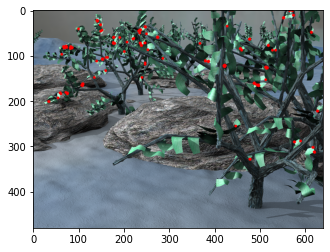

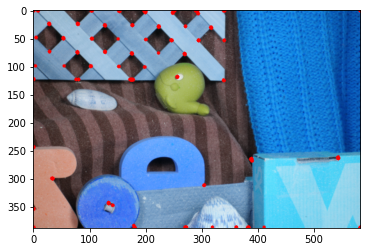

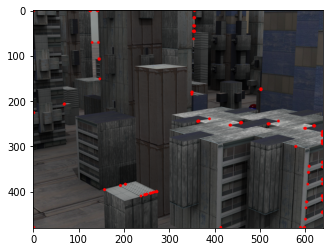

In [11]:
image1 = cv2.imread('../data/all-frames-colour/Grove3/frame07.png')
image2 = cv2.imread('../data/all-frames-colour/RubberWhale/frame07.png')
image3 = cv2.imread('../data/all-frames-colour/Urban2/frame07.png')
image1 = harris_corner(image1,2.5,0.05)
image2 = harris_corner(image2,0.18,0.05)
image3 = harris_corner(image3,0.07,0.05)
plt.imshow(image1)
path = '../results/HarrisCornerResults/Grove3.jpg'
plt.savefig(path, dpi=100,transparent=True)
plt.show()
plt.imshow(image2)
path = '../results/HarrisCornerResults/RubberWhale.jpg'
plt.savefig(path, dpi=100,transparent=True)
plt.show()
plt.imshow(image3)
path = '../results/HarrisCornerResults/Urban2.jpg'
plt.savefig(path, dpi=100,transparent=True)
plt.show()

#### Conclusions/Results

- Results for the harris corner detector are saved in results/HarrisCornerResults folder.
- Threshold for every image is different
- It is difficult for harris corner to detect corner on image where the change in intensities is very less.

### Shi-Tomasi Detector

For detecting corners using Shi-Tomasi Detector follow below steps -
- Firstly, convert the given RGB image into Grayscale image and then normalize it by dividing it by 255.
- Then find intensity Ix and Iy of a specified window by using Sobel filters and thus calculate Ixx, Ixy and Iyy.
- Once we get the Ixx, Ixy and Iyy, now we can find the R score by using formula 
    R = min(eigen1, eigen2)
- Now, find all the pixels which has R value greater than the threshold.
- The pixels which we got in above steps are our corners. we can see them by plotting them on original image.

In [35]:
def shi_tomasi(image, threshold):
    
    nor_image = normalize_image(image)
    Ixx, Ixy, Iyy = find_intensities(nor_image)
    
    det = (Ixx*Iyy) - (Ixy**2)
    det = np.where(det > 0)
    
    R = np.zeros((nor_image.shape))
    
    for i in range(len(det[0])): 
        x = det[0][i]
        y = det[1][i]
        A = [[Ixx[x][y],Ixy[x][y]],[Ixy[x][y],Iyy[x][y]]]
        A = np.array(A)
        val,_ = np.linalg.eig(A)
        if min(val)>threshold:
            R[x][y] = min(val)
    
    corners = np.where(R >= threshold)

    for pt in zip(*corners[::-1]):
        image = cv2.circle(image, pt, 3, (255, 0, 0), -1)
    return image

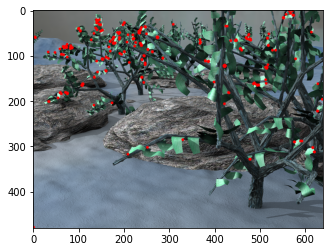

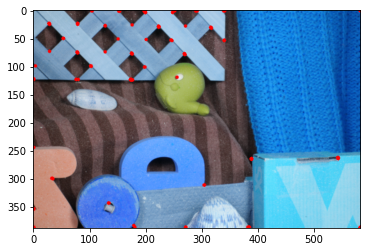

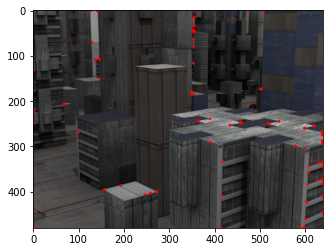

In [36]:
image1 = cv2.imread('../data/all-frames-colour/Grove3/frame07.png')
image2 = cv2.imread('../data/all-frames-colour/RubberWhale/frame07.png')
image3 = cv2.imread('../data/all-frames-colour/Urban2/frame07.png')
image1 = shi_tomasi(image1,1)
image2 = shi_tomasi(image2,0.35)
image3 = shi_tomasi(image3,0.18)
plt.imshow(image1)
path = '../results/ShiTomasiResults/Grove3.jpg'
plt.savefig(path, dpi=100,transparent=True)
plt.show()
plt.imshow(image2)
path = '../results/ShiTomasiResults/RubberWhale.jpg'
plt.savefig(path, dpi=100,transparent=True)
plt.show()
plt.imshow(image3)
path = '../results/ShiTomasiResults/Urban2.jpg'
plt.savefig(path, dpi=100,transparent=True)
plt.show()

#### Conclusions/Results

- Results for the Shi-Tomasi corner detector are saved in results/ShiTomasiResults folder.
- It can be observed that the Threshold for every image is different.
- It is difficult for shi-tomasi corner to detect corner on image where the change in intensities is very less.
- Shi-Tomasi gives better results than Harris Corner Detector

## 2.2 Forward-Additive Sparse Optical Flow

Below are the steps involved in finding the optical flow between two images :
- We are given 2 images and we need to find the optical flow between them
- First step is to normalize the images
- Then, we have to find the x, y and t component of each image by convolution the images with the appropriate mask.
- After that we have to find Ix, Iy and It.
- And thus calculate Ixx, Ixy, Iyy, Ixt and Iyt
- Once got the above values we need to find the points which has minimum eigen values more than the threshold(0.01) for matrix on the left side. 

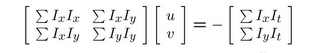
- For the points where the value is greater than 0.01 we need to find the u and v using below formula - 

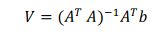
- Thus, the points which we got in above steps are our u and v
- To visualize u and v on image we can use quivor plot.

In [37]:
def LukasKanadeForwardAdditive(Img1, Img2, windowSize):
    
    nor_image1 = normalize_image(Img1)
    nor_image2 = normalize_image(Img2)
    
    nor_image1_x = convolution(nor_image1, Mask_x)
    nor_image1_y = convolution(nor_image1, Mask_y)
    nor_image1_t = convolution(nor_image1, Mask_t1)
    
    nor_image2_x = convolution(nor_image2, Mask_x)
    nor_image2_y = convolution(nor_image2, Mask_y)
    nor_image2_t = convolution(nor_image2, Mask_t2)
    
    Ix = (nor_image1_x + nor_image2_x)/2
    Iy = (nor_image1_y + nor_image2_y)/2
    It = nor_image1_t + nor_image2_t
    
    c_filter = np.ones(windowSize)
    u = np.zeros((nor_image1.shape))
    v = np.zeros((nor_image1.shape)) 
    
    Ixx = np.square(Ix)
    Ixx = convolution(Ixx, c_filter)
    Iyy = np.square(Iy)
    Iyy = convolution(Iyy, c_filter)
    Ixy = Ix*Iy
    Ixy = convolution(Ixy, c_filter)
    Ixt = Ix*It
    Ixt = convolution(Ixt, c_filter)
    Iyt = Iy*It
    Iyt = convolution(Iyt, c_filter)
        
    d = Ixx * Iyy - Ixy**2
    points = np.where(d > 0)  
    
    for pt in range(points[0].shape[0]): 
        i,j = points[0][pt], points[1][pt]
        A = [[Ixx[i][j],Ixy[i][j]],[Ixy[i][j],Iyy[i][j]]]
        A = np.array(A)
        eig,_ = np.linalg.eig(A)
        if min(eig)>=0.01:
            A_inverse = np.linalg.inv(A)
            At_B = np.array([[-1*Ixt[i][j]],[-1*Iyt[i][j]]])
            V = np.matmul(A_inverse,At_B)
            u[i][j], v[i][j] = V[0], V[1]
    return u,v 

In [38]:
def find_optical_flow(foldername, threshold):
    set_of_u = []
    set_of_v = []
    set_of_uv= []
    for i in range(7,14):
        img1, img2 = name_of_image(foldername, i)    
        
        windowSize = (5,5)
        Img1 = cv2.imread(img1)
        Img2 = cv2.imread(img2)
        u,v = LukasKanadeForwardAdditive(Img1,Img2,windowSize)

        u_p = np.where(abs(u)>=threshold)
        v_p = np.where(abs(v)>=threshold)
        
        final_list = []

        set_of_u.append(u)
        set_of_v.append(v)
        uv = compute_color(u,v)
        set_of_uv.append(uv)

        for j in range(len(u_p[0])):
            final_list.append([u_p[0][j], u_p[1][j]])
        
        for j in range(len(v_p[0])):
            temp = [v_p[0][j], v_p[1][j]]
            if temp not in final_list:
                final_list.append(temp)
                
        quiver_list = []
        for j in final_list:
            if check_dist(quiver_list,j,25):
                quiver_list.append(j)

        image1 = cv2.imread(img1)
        plt.imshow(image1)
        for l in quiver_list:
            x = l[0]
            y = l[1]
            plt.quiver(y,x,u[x][y],v[x][y], color = "red")
        path = '../results/LukasKanadeForwardAdditive/'+ foldername +'/quiverplot/frame{}.jpg'.format(i-6)
        plt.savefig(path, dpi=200,transparent=True)
        plt.show()

    for i in range(len(set_of_u)):
        plt.imshow(set_of_u[i])
        path = '../results/LukasKanadeForwardAdditive/'+ foldername +'/u/frame{}.jpg'.format(i+1)
        plt.savefig(path, dpi=100,transparent=True)
        plt.show()
        

    for i in range(len(set_of_v)):
        plt.imshow(set_of_v[i])
        path = '../results/LukasKanadeForwardAdditive/'+ foldername +'/v/frame{}.jpg'.format(i+1)
        plt.savefig(path, dpi=100,transparent=True)
        plt.show()
        
    for i in range(len(set_of_uv)):
        plt.imshow(set_of_uv[i])
        path = '../results/LukasKanadeForwardAdditive/'+ foldername +'/uv/frame{}.jpg'.format(i+1)
        plt.savefig(path, dpi=100,transparent=True)
        plt.show()
        
        
    convert_frames_to_video('../results/LukasKanadeForwardAdditive/'+foldername+'/quiverplot/', '../results/LukasKanadeForwardAdditive/'+foldername+'/quiverplot/video.avi', 2)
    convert_frames_to_video('../results/LukasKanadeForwardAdditive/'+foldername+'/u/', '../results/LukasKanadeForwardAdditive/'+foldername+'/u/video.avi', 2)
    convert_frames_to_video('../results/LukasKanadeForwardAdditive/'+foldername+'/v/', '../results/LukasKanadeForwardAdditive/'+foldername+'/v/video.avi', 2)
    convert_frames_to_video('../results/LukasKanadeForwardAdditive/'+foldername+'/uv/', '../results/LukasKanadeForwardAdditive/'+foldername+'/uv/video.avi', 2)

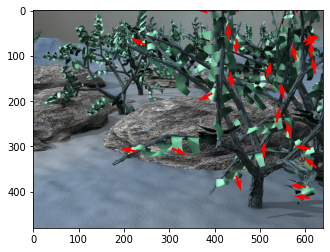

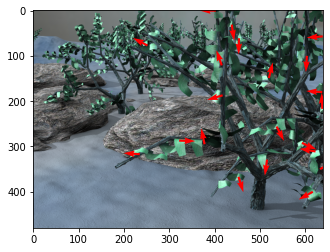

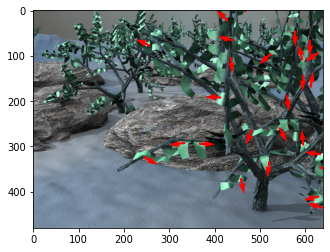

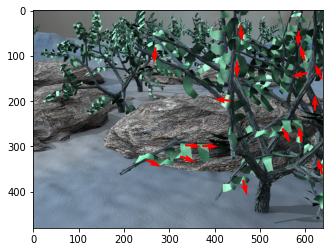

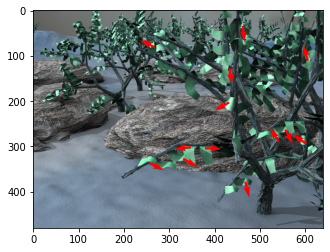

...

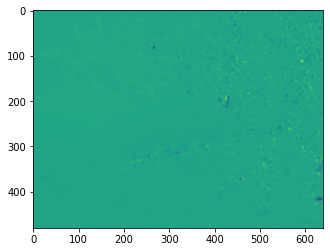

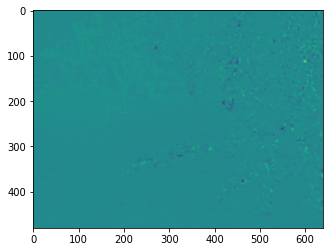

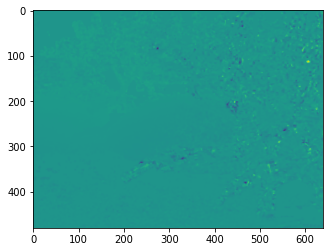

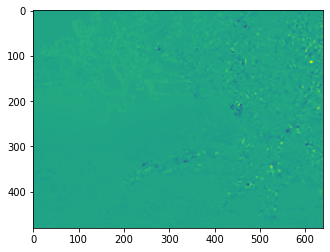

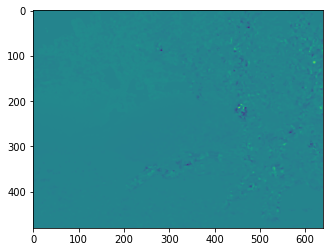

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


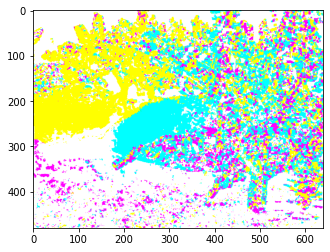

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


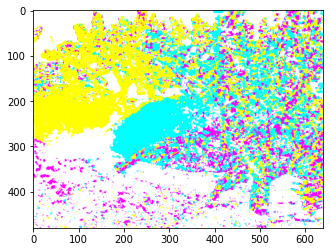

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


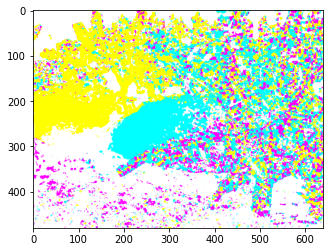

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


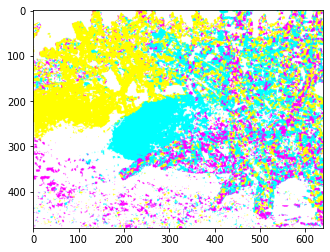

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


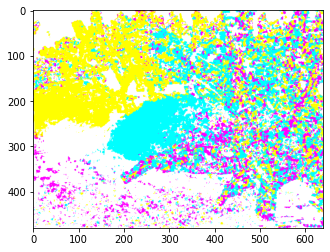

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


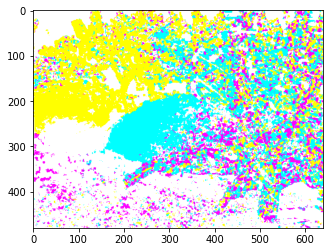

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


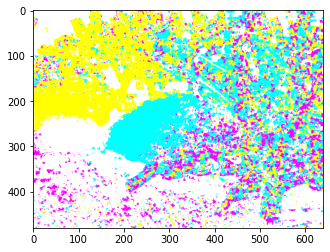

Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video


In [39]:
find_optical_flow('Grove3',30)

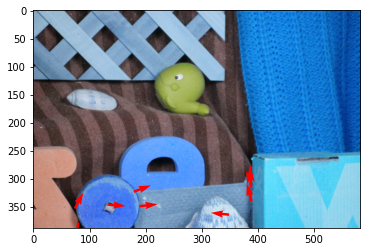

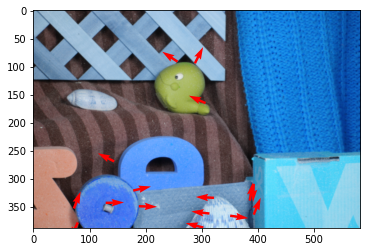

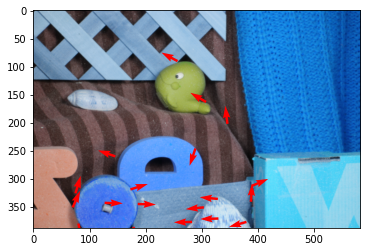

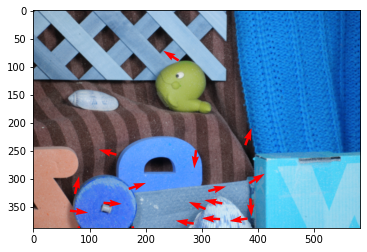

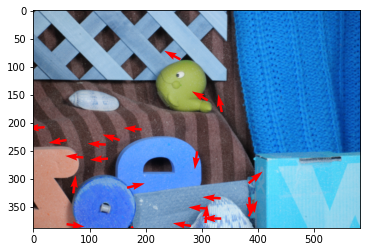

...

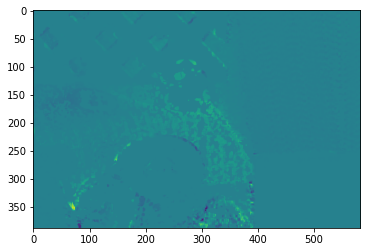

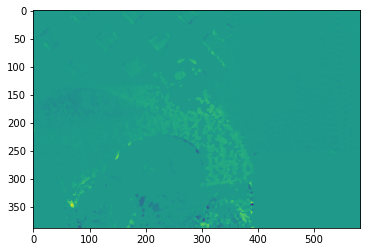

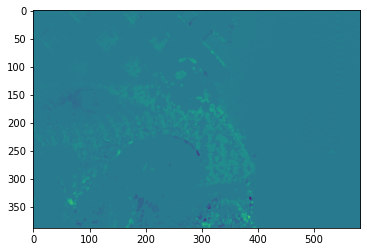

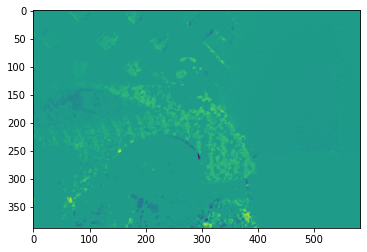

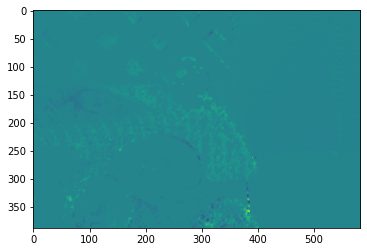

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


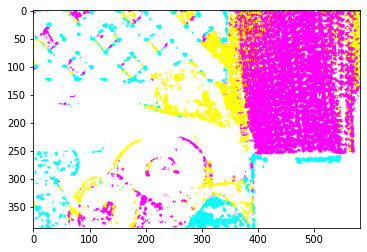

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


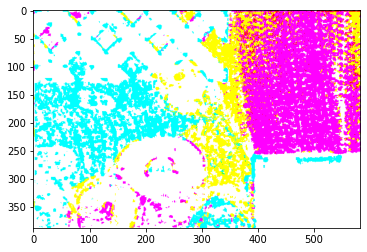

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


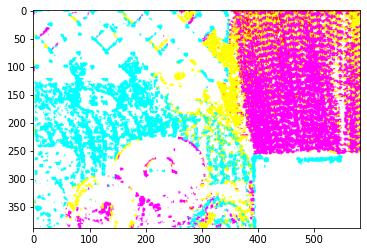

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


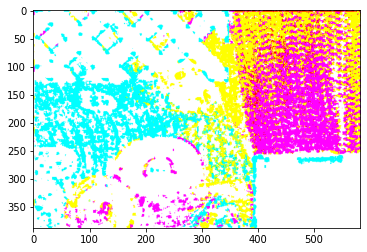

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


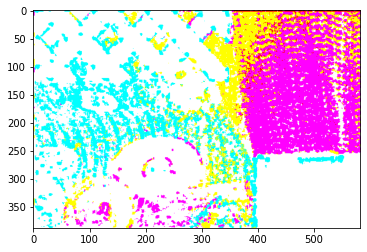

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


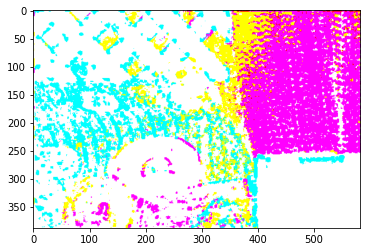

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


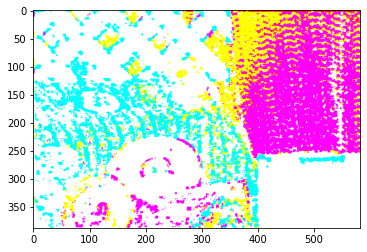

Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video


In [17]:
find_optical_flow('RubberWhale',5)

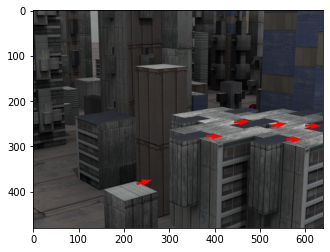

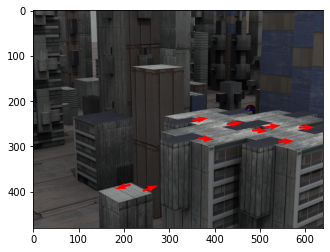

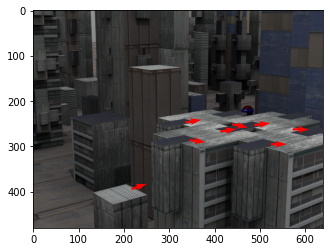

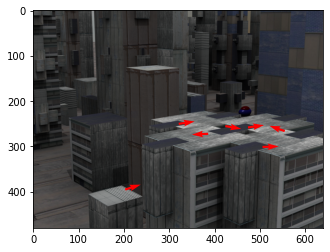

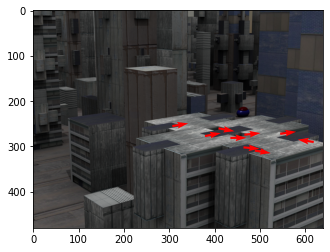

...

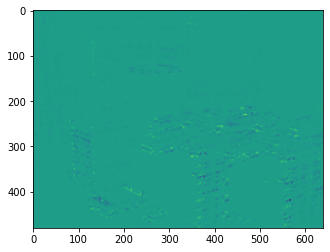

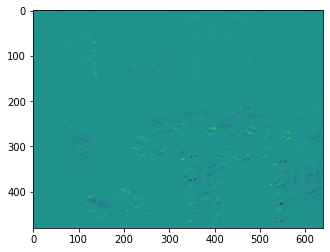

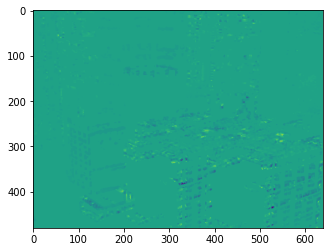

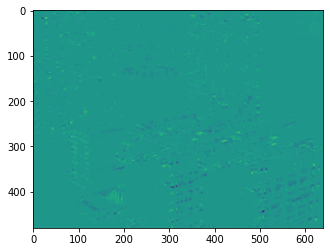

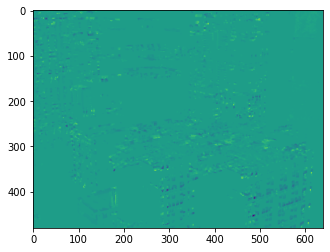

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


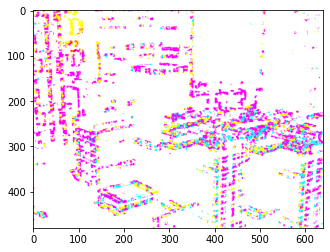

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


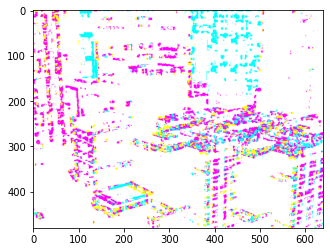

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


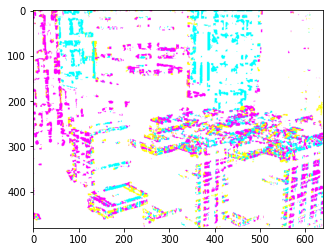

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


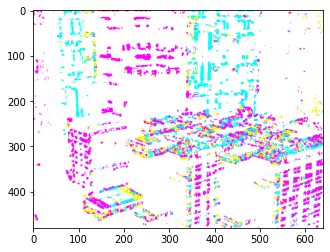

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


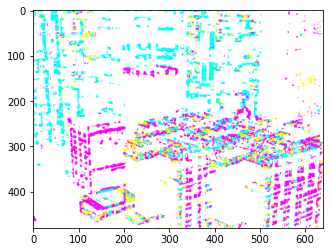

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


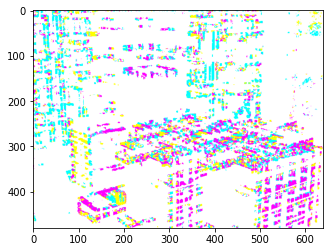

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


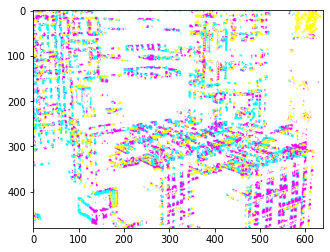

Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video


In [18]:
find_optical_flow('Urban2',35)

## 2.3 Analyzing Lucas-Kanade Method

#### 1. Why is optical flow only valid in the regions where local structure-tensor A<sup>T</sup>A has a rank 2? What role does the threshold (τ) play here?
<b>Answer - </b> We need 2 tensors because we need 2 eigen values of the matrix. The eigen values are directly proportional to the change in x and y directions.The smaller eigen value should be greater than threshold for the pixel to be considered. We the rank of the A<sup>T</sup> matrix is one than we will only be able to identify the change in any one of the direction not in both x and y and optical can be in any or both the direction. Henec, optical flow is only valid in the regions where local structure-tensor A<sup>T</sup> has a rank 2.To identify the best features we need threshold. Threshold basically checks if the value at certain pixel is high to be classified as a corner or not. In our case, we have taken threshold of value of 0.01 which means we will take all the pixels for which the value is greater than threshold. 

#### 2. In the experiments, did you use any modifications and/or thresholds? Does this algorithm work well for these test images? If not, why?
<b> Answer - </b> There are multiple threshold I have used like the most important one is tau. All the other threshold which are used is for better visualization of results like in case where we have to draw the quivor plot I have taken some of the points so that the plot looks better.The algorithm works well but it also detect some of the noisy part of the image as corner.

#### 3. Try experimenting with different window sizes. What are the trade-offs associated with using a small versus a large window size? Can you explain what’s happening?

<b>Answer - </b> On performing the experiment using differnet sizes it is obsereved that - 
1. In case of large window size the accuracy of result hamper in case of small motion when there is very small change between frames but when there is large motion change then large window size works better than small window size.
2. In case of small window size we get more accurate results on a pixel level when the motion between two consecutive frames is very less but the drawback of small size winodw is we are not able to identify large motion change. 

#### 4. There are locations in an image where Lucas–Kanade optical flow will fail, regardless of choice of window size and sigma for Gaussian smoothing. Describe two such situations.You are not required to demonstrate them.

<b> Answer - </b> These are two conditions where Lucas-Kanade optical flow will fail -

<b>1. Speed - </b> When the instantaneous velocity of the point is too large with respect to the window where motion is being considered. Hence, <b>It</b> loses its meaning of temporal derivative.

<b>2. Rotations - </b> The motion around the point has a strong rotational component and thus, even locally, the assumption regarding the similarity of velocities falls.

#### 5. Did you observe that the ground truth visualizations are in HSV colour space? Try to reason it.
<b> Answer - </b> HSV stands for Hue, Saturation and Value. Hue in HSV determine the color portion of the image, hue lies between 0 to 360 degrees where each 60 degree bracket has a color assigned to it. Saturation describes amount to gray in particular color it lies between 0 to 1 or 0 to 100% where 0 means completely gray and 1 means completely primary color. Third component which is Value is the amount of brightness or intensity of the color where 0 means completely black and 1 means completely bright.Ground truth visulaizations are in HSV color space because optimal flow works on the assumption that the brightness of any pixel is conserved. In HSV, one of the three components is brightness/value. So, HSV color space give better visualization than any of other methods. Hence, HSV colour space is used for visualization.

#### Conclusions/Results

- Results for the Foward Additive Lucas Kanade saved in results/LukasKanadeForwardAdditive folder.

# 3. Multi-Scale Coarse-to-fine Optical Flow

Steps to find the optical flow using multi scale lucas kanade -
- Make pyramids of Image1 and Image2 separtely where each level is downscaled by 2
- Compute the optical flow each level of Images starting from 0th level (least size image)
- Scale up the optical flow which is calculated by previous state and upscale it by 2
- Use the above optical flow as intial optical flow for the current level.
- The optical flow we got from last step is our optimal optical flow.

In [19]:
def OpticalFlowRefine(Img1, Img2, windowSize, u0, v0):
    
    if len(Img1.shape)==3:
        nor_image1 = normalize_image(Img1)
        nor_image2 = normalize_image(Img2)
    else:
        nor_image1 = Img1
        nor_image2 = Img2
        

    u_max = np.absolute(u0)
    v_max = np.absolute(v0)
    u_max = np.amax(u_max)
    v_max = np.amax(v_max)
    
    u_max = u_max.astype(int)
    v_max = v_max.astype(int)

    nor_image2 = np.pad(nor_image2,[(u_max, ), (v_max, )],mode='constant', constant_values=0)
        
    nor_image1_x = convolution(nor_image1, Mask_x)
    nor_image1_y = convolution(nor_image1, Mask_y)
    nor_image1_t = convolution(nor_image1, Mask_t1)
    
    nor_image2_x = convolution(nor_image2, Mask_x)
    nor_image2_y = convolution(nor_image2, Mask_y)
    nor_image2_t = convolution(nor_image2, Mask_t2)
        
    Ix = np.zeros((nor_image1.shape))
    Iy = np.zeros((nor_image1.shape))
    It = np.zeros((nor_image1.shape))
    
    u0 = u0.astype(int)
    v0 = v0.astype(int)
    
    for i in range(nor_image1.shape[0]):
        for j in range(nor_image1.shape[1]):
            x = v_max+u0[i][j]
            y = u_max+v0[i][j]
            Ix[i][j] = (nor_image1_x[i][j] + nor_image2_x[x][y])/2
            Iy[i][j] = (nor_image1_y[i][j] + nor_image2_y[x][y])/2
            It[i][j] = (nor_image1_t[i][j] + nor_image2_t[x][y])
    
    c_filter = np.ones(windowSize)
    u = np.zeros((nor_image1.shape))
    v = np.zeros((nor_image1.shape)) 
    
    Ixx = np.square(Ix)
    Ixx = convolution(Ixx, c_filter)
    Iyy = np.square(Iy)
    Iyy = convolution(Iyy, c_filter)
    Ixy = Ix*Iy
    Ixy = convolution(Ixy, c_filter)
    Ixt = Ix*It
    Ixt = convolution(Ixt, c_filter)
    Iyt = Iy*It
    Iyt = convolution(Iyt, c_filter)
    
    d = Ixx * Iyy - Ixy**2
    points = np.where(d > 0)
    
    for pt in range(points[0].shape[0]): 
        i,j = points[0][pt], points[1][pt]
        A = [[Ixx[i][j],Ixy[i][j]],[Ixy[i][j],Iyy[i][j]]]
        A = np.array(A)
        eig,_ = np.linalg.eig(A)
        if min(eig)>=0.01:
            A_inverse = np.linalg.inv(A)
            At_B = np.array([[-1*Ixt[i][j]],[-1*Iyt[i][j]]])
            V = np.matmul(A_inverse,At_B)
            u[i][j], v[i][j] = V[0], V[1]
    return u,v                  
                        

In [20]:
def MultiScaleLucasKanade(Img1, Img2, windowSize, numLevels):

    nor_image1 = normalize_image(Img1)
    nor_image2 = normalize_image(Img2)
    
    shape = nor_image1.shape
    pyramid1 = []
    pyramid2 = []
    
    temp1 = nor_image1
    temp2 = nor_image2
    
    for i in range(0,numLevels):
        pyramid1.append(temp1)
        pyramid2.append(temp2)
        temp1 = downgrade(temp1)
        temp2 = downgrade(temp2)
    
    u_final,v_final = LukasKanadeForwardAdditive(Img1,Img2,windowSize)
    
    k = 2**(numLevels-1)
    u_final = u_final[::k, ::k]
    v_final = v_final[::k, ::k]

    for i in range(numLevels-1,-1,-1):
        pyramid1[i] = np.array(pyramid1[i])
        pyramid2[i] = np.array(pyramid2[i])
        I1 = pyramid1[i]
        I2 = pyramid2[i]
        u_final, v_final = OpticalFlowRefine(I1,I2,windowSize,u_final,v_final)
        if i != 0:
            u_final = upgrade(u_final)
            v_final = upgrade(v_final)
            
    return u_final,v_final
            

In [21]:
def find_optical_flow_multiple_lucas_kanade(foldername, threshold, numLevels):
    
    set_of_u = []
    set_of_v = []
    set_of_uv= []
    for i in range(7,14):
        img1, img2 = name_of_image(foldername, i)    
        
        windowSize = (5,5)
        Img1 = cv2.imread(img1)
        Img2 = cv2.imread(img2)
        u,v = MultiScaleLucasKanade(Img1,Img2,windowSize,numLevels)

        u_p = np.where(abs(u)>=threshold)
        v_p = np.where(abs(v)>=threshold)
        
        final_list = []

        set_of_u.append(u)
        set_of_v.append(v)
        uv = compute_color(u,v)
        set_of_uv.append(uv)

        for j in range(len(u_p[0])):
            final_list.append([u_p[0][j], u_p[1][j]])
        
        for j in range(len(v_p[0])):
            temp = [v_p[0][j], v_p[1][j]]
            if temp not in final_list:
                final_list.append(temp)
                
        quiver_list = []
        for j in final_list:
            if check_dist(quiver_list,j,25):
                quiver_list.append(j)

        image1 = cv2.imread(img1)
        plt.imshow(image1)
        for l in quiver_list:
            x = l[0]
            y = l[1]
            plt.quiver(y,x,u[x][y],v[x][y], color = "red")
        path = '../results/MultiScaleLucasKanade/'+ foldername +'/quiverplot/frame{}.jpg'.format(i-6)
        plt.savefig(path, dpi=200,transparent=True)
        plt.show()

    for i in range(len(set_of_u)):
        plt.imshow(set_of_u[i])
        path = '../results/MultiScaleLucasKanade/'+ foldername +'/u/frame{}.jpg'.format(i+1)
        plt.savefig(path, dpi=100,transparent=True)
        plt.show()
        

    for i in range(len(set_of_v)):
        plt.imshow(set_of_v[i])
        path = '../results/MultiScaleLucasKanade/'+ foldername +'/v/frame{}.jpg'.format(i+1)
        plt.savefig(path, dpi=100,transparent=True)
        plt.show()
        
    for i in range(len(set_of_uv)):
        plt.imshow(set_of_uv[i])
        path = '../results/MultiScaleLucasKanade/'+ foldername +'/uv/frame{}.jpg'.format(i+1)
        plt.savefig(path, dpi=100,transparent=True)
        plt.show()
        
        
    convert_frames_to_video('../results/MultiScaleLucasKanade/'+foldername+'/quiverplot/', '../results/MultiScaleLucasKanade/'+foldername+'/quiverplot/video.avi', 2)
    convert_frames_to_video('../results/MultiScaleLucasKanade/'+foldername+'/u/', '../results/MultiScaleLucasKanade/'+foldername+'/u/video.avi', 2)
    convert_frames_to_video('../results/MultiScaleLucasKanade/'+foldername+'/v/', '../results/MultiScaleLucasKanade/'+foldername+'/v/video.avi', 2)
    convert_frames_to_video('../results/MultiScaleLucasKanade/'+foldername+'/uv/', '../results/MultiScaleLucasKanade/'+foldername+'/uv/video.avi', 2)

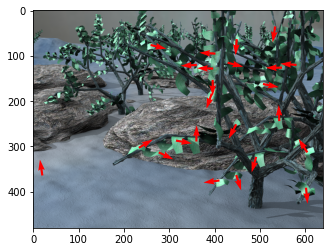

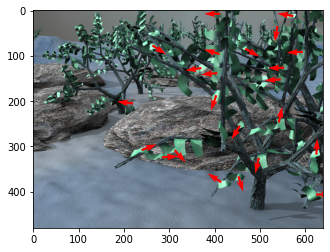

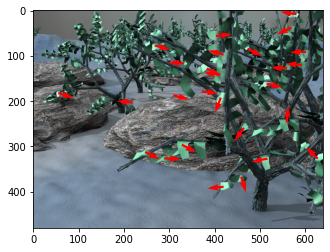

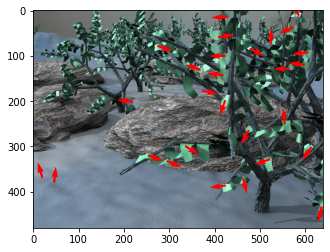

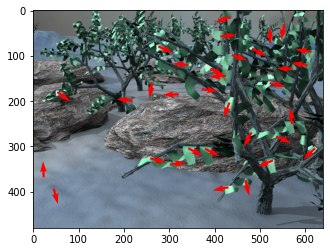

...

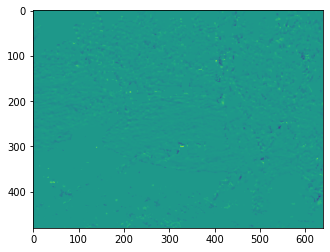

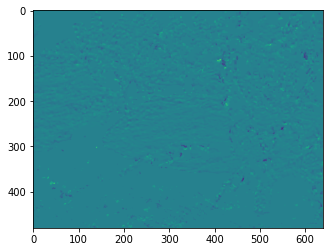

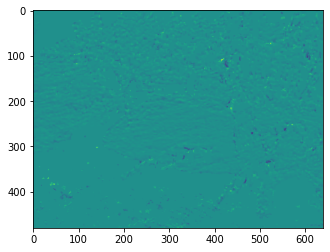

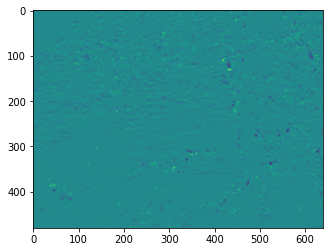

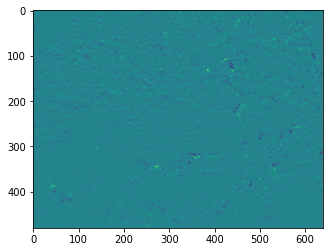

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


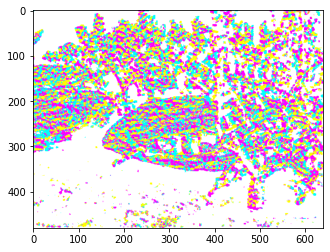

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


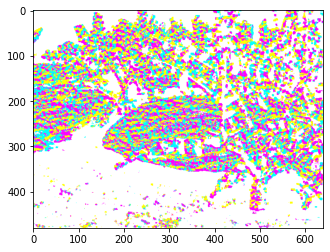

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


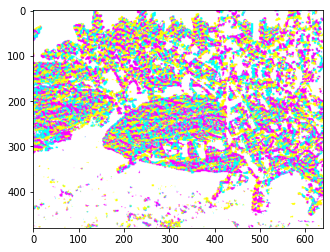

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


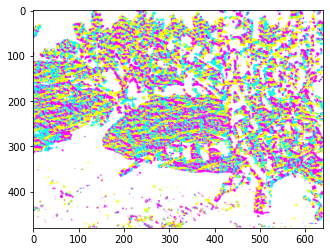

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


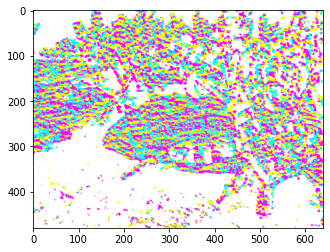

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


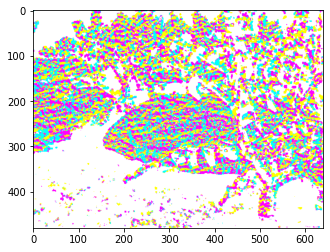

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


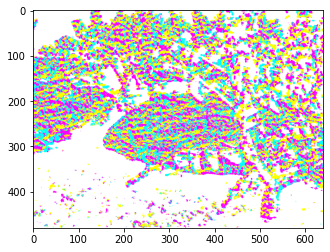

Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video


In [22]:
find_optical_flow_multiple_lucas_kanade('Grove3', 70, 3)

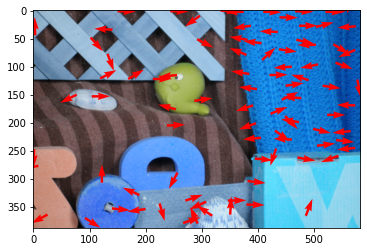

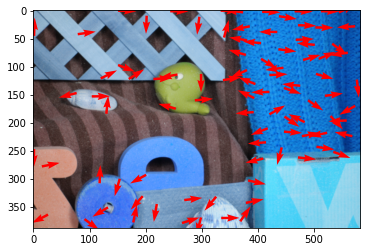

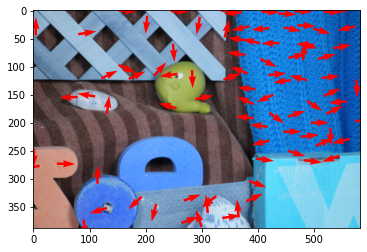

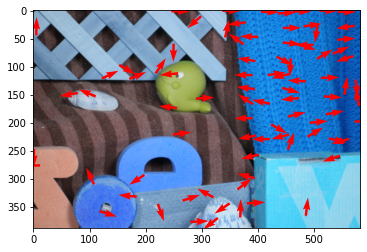

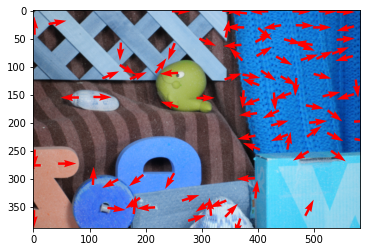

...

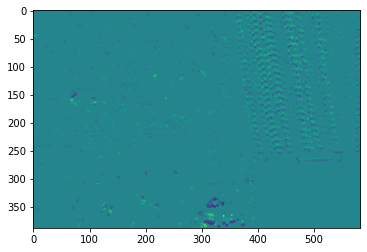

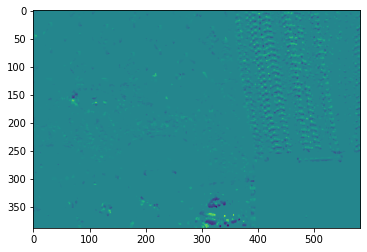

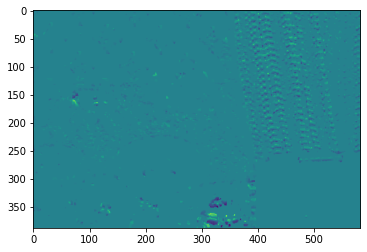

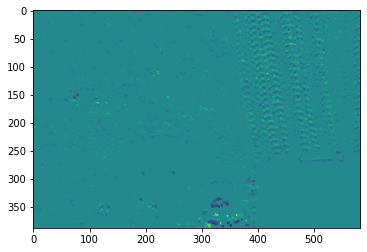

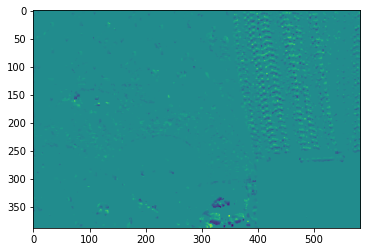

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


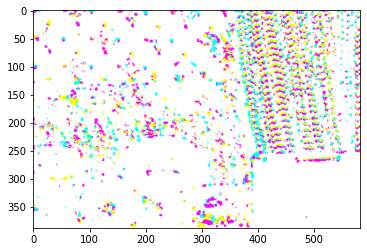

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


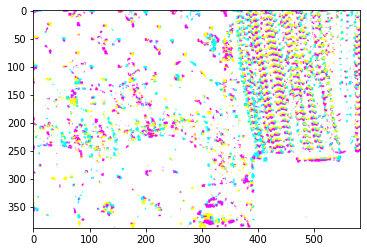

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


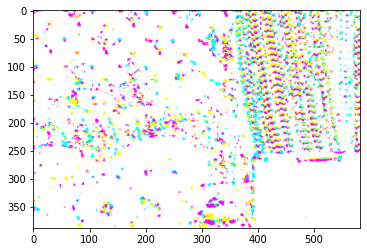

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


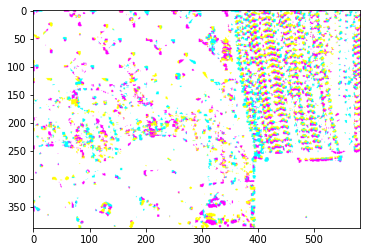

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


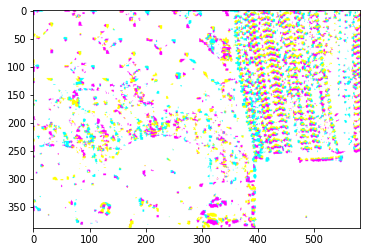

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


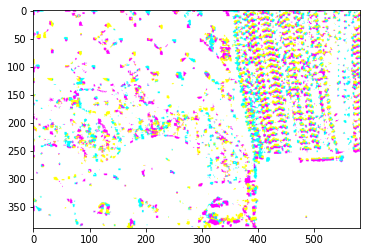

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


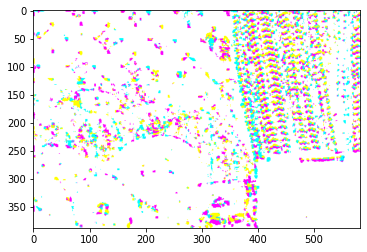

Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 9 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video


In [23]:
find_optical_flow_multiple_lucas_kanade('RubberWhale', 50, 3)

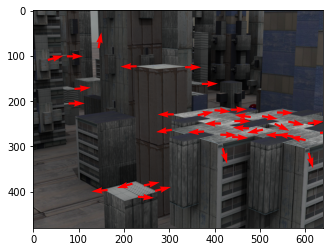

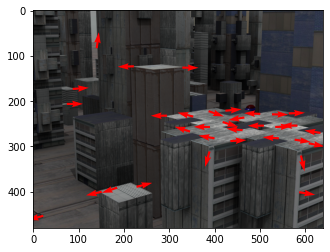

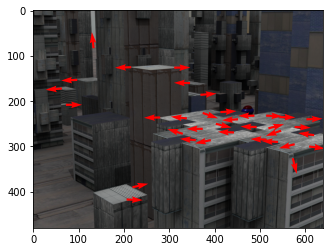

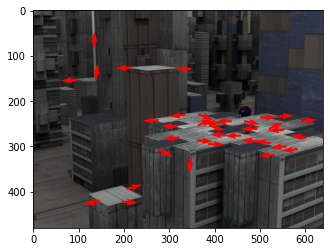

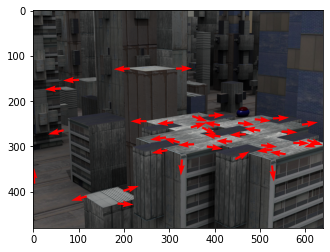

...

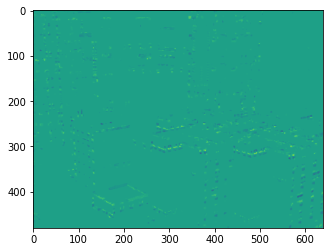

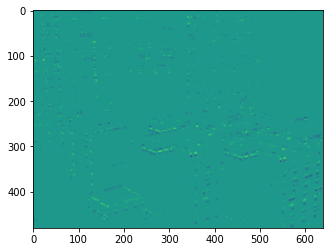

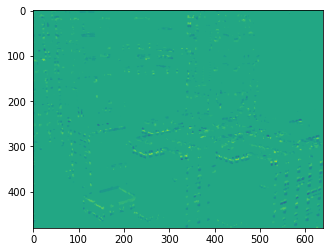

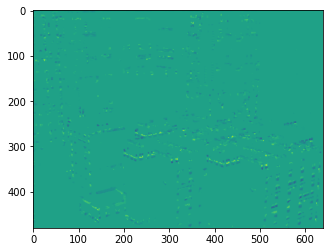

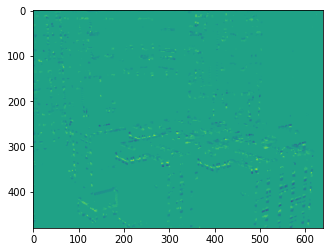

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


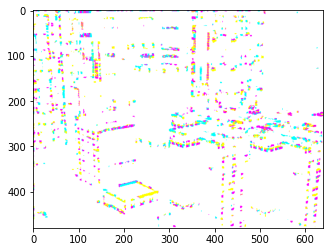

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


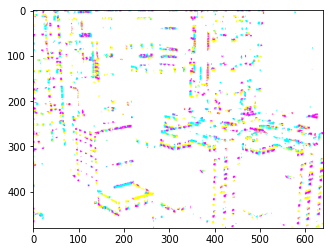

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


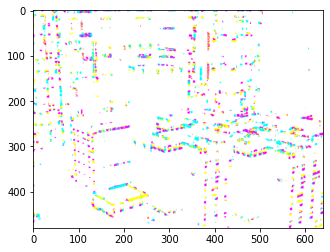

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


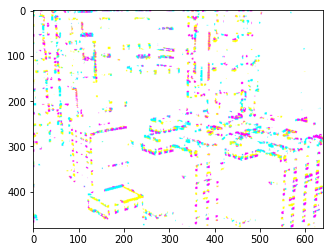

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


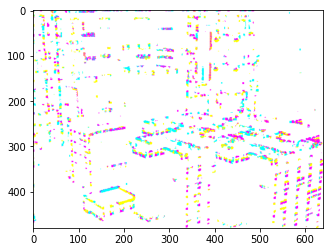

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


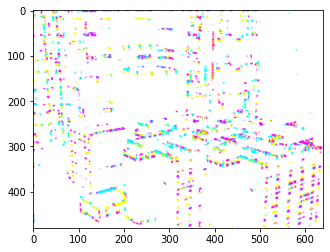

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


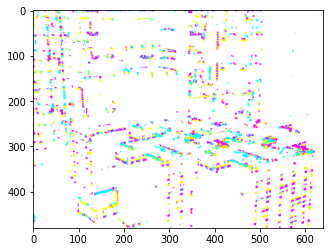

Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video
Frame 1 added to video
Frame 2 added to video
Frame 3 added to video
Frame 4 added to video
Frame 5 added to video
Frame 6 added to video
Frame 7 added to video
Frame 8 added to video


In [24]:
find_optical_flow_multiple_lucas_kanade('Urban2', 35, 3)